In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import glob

In [30]:
def calculate_moments(df, w, col_name):
    """
    Calculate variance, skewness, and kurtosis of a specified column over a sliding window of size w.

    Parameters:
    df (pandas.DataFrame): DataFrame with the column to calculate moments.
    w (int): Window size.
    col_name (str): Name of the column to calculate moments.

    Returns:
    pandas.DataFrame: DataFrame with added moment columns.
    """
    # Ensure column exists
    if col_name not in df.columns:
        raise ValueError(f"Column '{col_name}' not found in DataFrame")

    # Calculate variance, skewness, and kurtosis over sliding window
    df[f'{col_name}_Variance'] = df[col_name].rolling(window=w).var()
    df[f'{col_name}_Skewness'] = df[col_name].rolling(window=w).skew()
    df[f'{col_name}_Kurtosis'] = df[col_name].rolling(window=w).kurt()

    # Shift moment values to align with the end of the window
    df[f'{col_name}_Variance'] = df[f'{col_name}_Variance'].shift(-(w-1))
    df[f'{col_name}_Skewness'] = df[f'{col_name}_Skewness'].shift(-(w-1))
    df[f'{col_name}_Kurtosis'] = df[f'{col_name}_Kurtosis'].shift(-(w-1))

    # Fill NaN values in the first w-1 rows
    df[f'{col_name}_Variance'] = df[f'{col_name}_Variance'].fillna(0)
    df[f'{col_name}_Skewness'] = df[f'{col_name}_Skewness'].fillna(0)
    df[f'{col_name}_Kurtosis'] = df[f'{col_name}_Kurtosis'].fillna(0)

    return df

In [ ]:
datafolder = '/home/trijya/VersionControl/strym_notebooks/StateData__20_Hz'
csvlisttmp = glob.glob(datafolder+"/*.csv")
csvlisttmp

In [34]:
df

,Clock,Time,speed,distance_covered,accely,yaw_rate,steer_rate,steer_angle,steer_fraction,wheel_speed_fl,...,wheel_speed_rr,lead_distance,acc_status,relative_vel,speed_Variance,speed_Skewness,speed_Kurtosis,relative_vel_Variance,relative_vel_Skewness,relative_vel_Kurtosis
0,2020-06-19 16:57:52.065143040,1.592586e+09,35.31,2.070043,-0.14288,-2.024,16.0,-9.0,-0.1,35.26,...,35.12,25.0,0.0,-4.5696,3.000333e-01,0.513352,0.0,2.718912e-02,1.732051,0.0
1,2020-06-19 16:57:52.115144960,1.592586e+09,34.67,3.623861,0.00068,-1.536,16.0,-6.0,-0.1,34.56,...,34.51,24.0,0.0,-4.8552,1.108333e-01,1.055832,0.0,-2.949030e-16,0.000000,0.0
2,2020-06-19 16:57:52.165146880,1.592586e+09,34.22,4.935527,0.21602,-0.804,29.0,-1.5,0.1,34.01,...,34.03,23.0,0.0,-4.8552,3.301333e-01,-1.498959,0.0,1.087565e-01,-1.732051,0.0
3,2020-06-19 16:57:52.215148800,1.592586e+09,34.02,7.002335,0.25191,-0.316,20.0,0.0,0.7,33.89,...,33.78,23.0,0.0,-4.8552,1.015233e+00,-0.369630,0.0,1.087565e-01,1.732051,0.0
4,2020-06-19 16:57:52.265150464,1.592586e+09,33.14,8.605021,0.10835,0.416,2.0,1.5,0.5,32.89,...,33.08,21.0,0.0,-5.4264,2.626728e+03,1.731104,0.0,9.815272e+00,1.732051,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32782,2020-06-19 17:25:11.225595648,1.592588e+09,0.00,153095.831020,0.03657,-0.072,0.0,-3.0,0.4,0.00,...,0.00,5.0,2.0,0.0000,-3.584099e-10,0.000000,0.0,-3.985354e-14,0.000000,0.0
32783,2020-06-19 17:25:11.275597568,1.592588e+09,0.00,153095.831020,0.03657,-0.072,0.0,-3.0,0.4,0.00,...,0.00,5.0,2.0,0.0000,-3.584099e-10,0.000000,0.0,-3.985354e-14,0.000000,0.0
32784,2020-06-19 17:25:11.325599488,1.592588e+09,0.00,153095.831020,0.03657,-0.072,0.0,-3.0,0.4,0.00,...,0.00,5.0,2.0,0.0000,-3.584099e-10,0.000000,0.0,-3.985354e-14,0.000000,0.0
32785,2020-06-19 17:25:11.375601408,1.592588e+09,0.00,153095.831020,0.03657,-0.072,0.0,-3.0,0.4,0.00,...,0.00,5.0,2.0,0.0000,0.000000e+00,0.000000,0.0,0.000000e+00,0.000000,0.0


In [35]:
df.columns

Index(['Clock', 'Time', 'speed', 'distance_covered', 'accely', 'yaw_rate',
       'steer_rate', 'steer_angle', 'steer_fraction', 'wheel_speed_fl',
       'wheel_speed_fr', 'wheel_speed_rl', 'wheel_speed_rr', 'lead_distance',
       'acc_status', 'relative_vel', 'speed_Variance', 'speed_Skewness',
       'speed_Kurtosis', 'relative_vel_Variance', 'relative_vel_Skewness',
       'relative_vel_Kurtosis'],
      dtype='object')

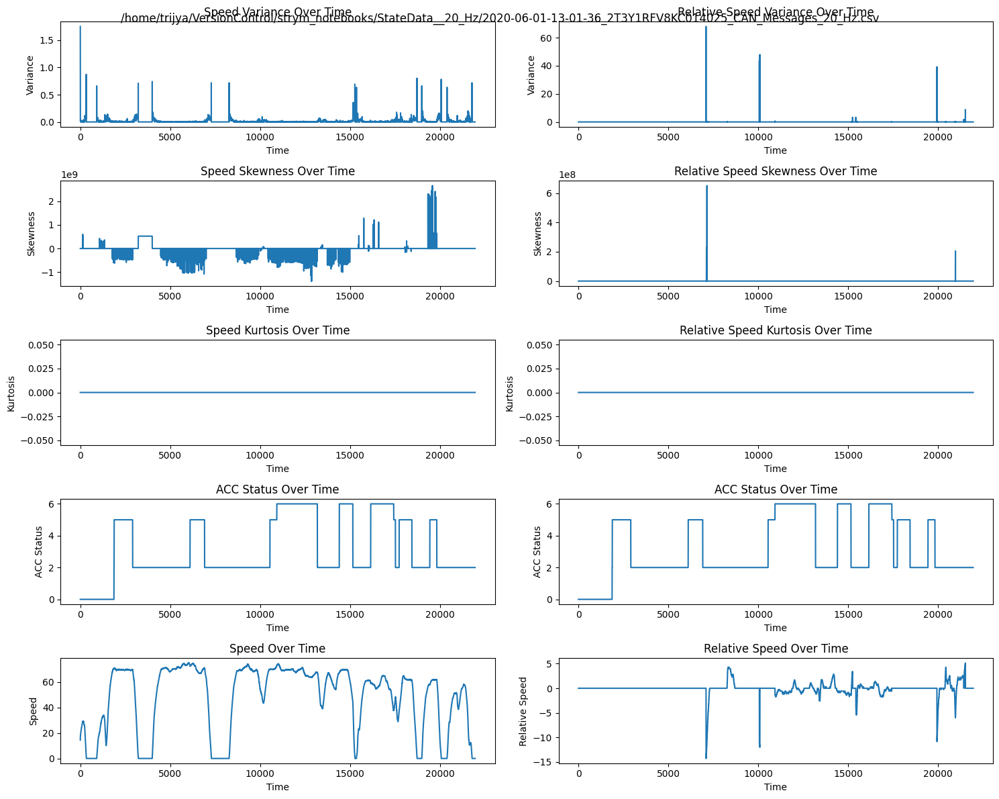

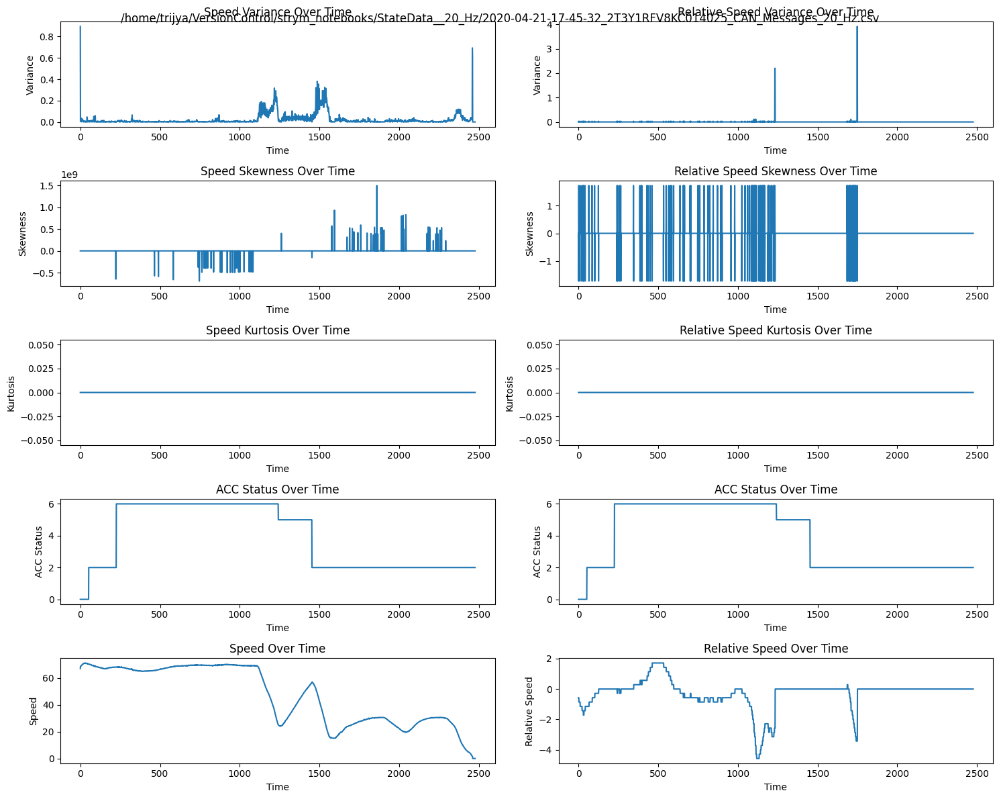

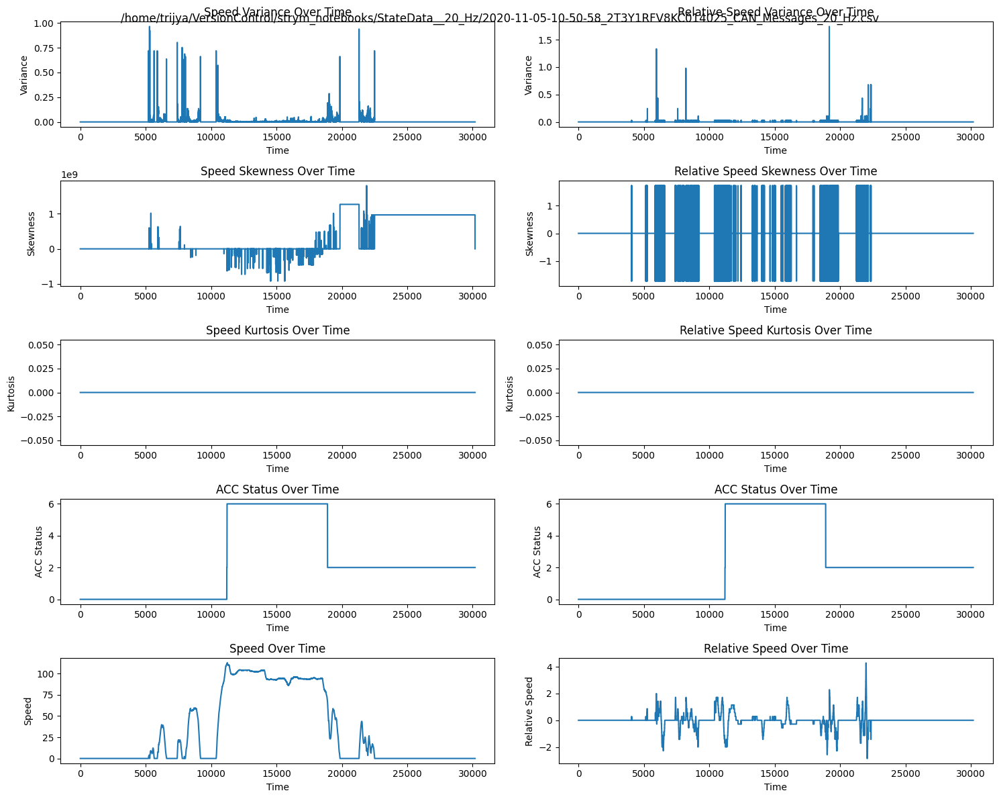

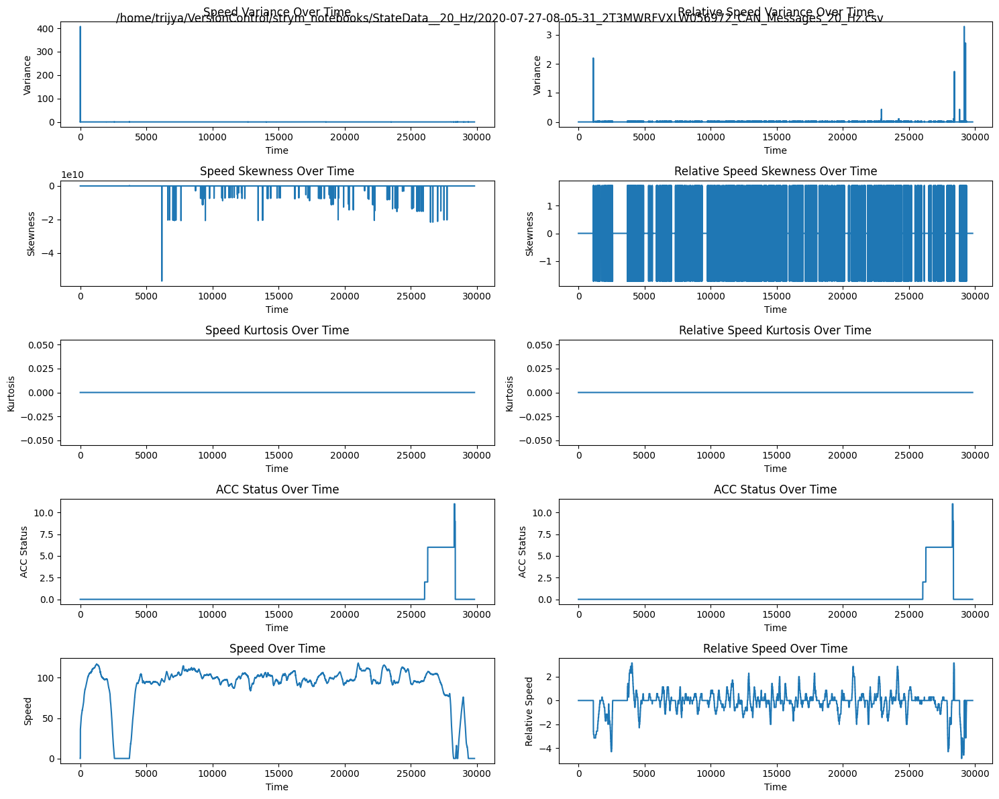

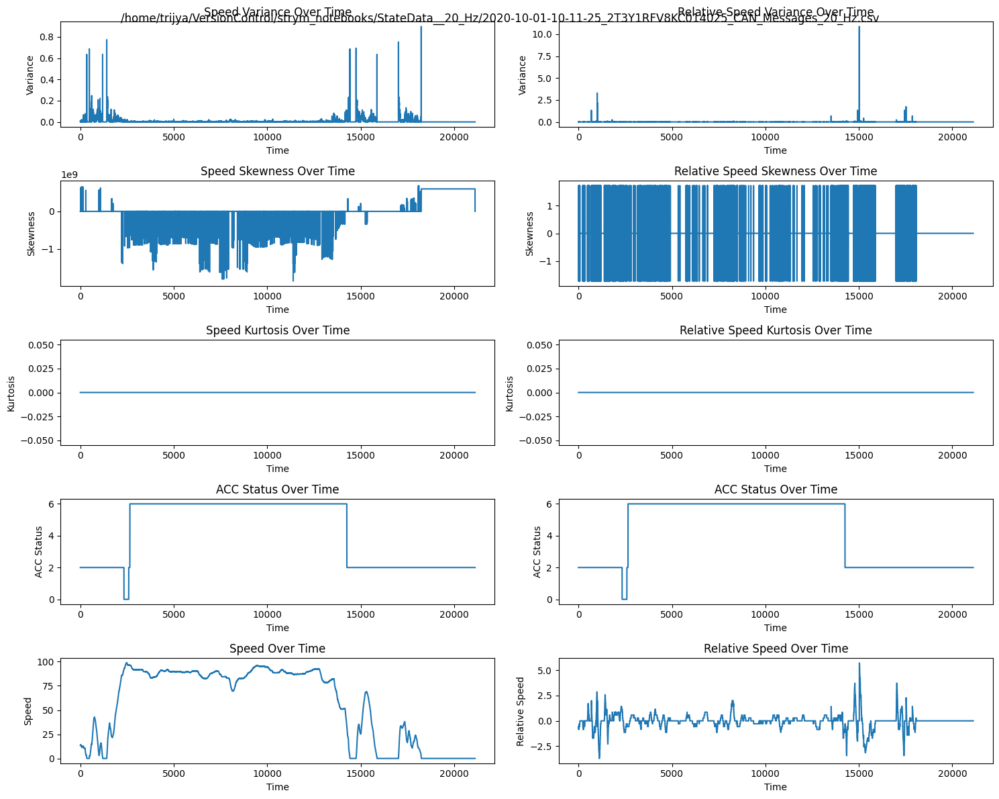

...

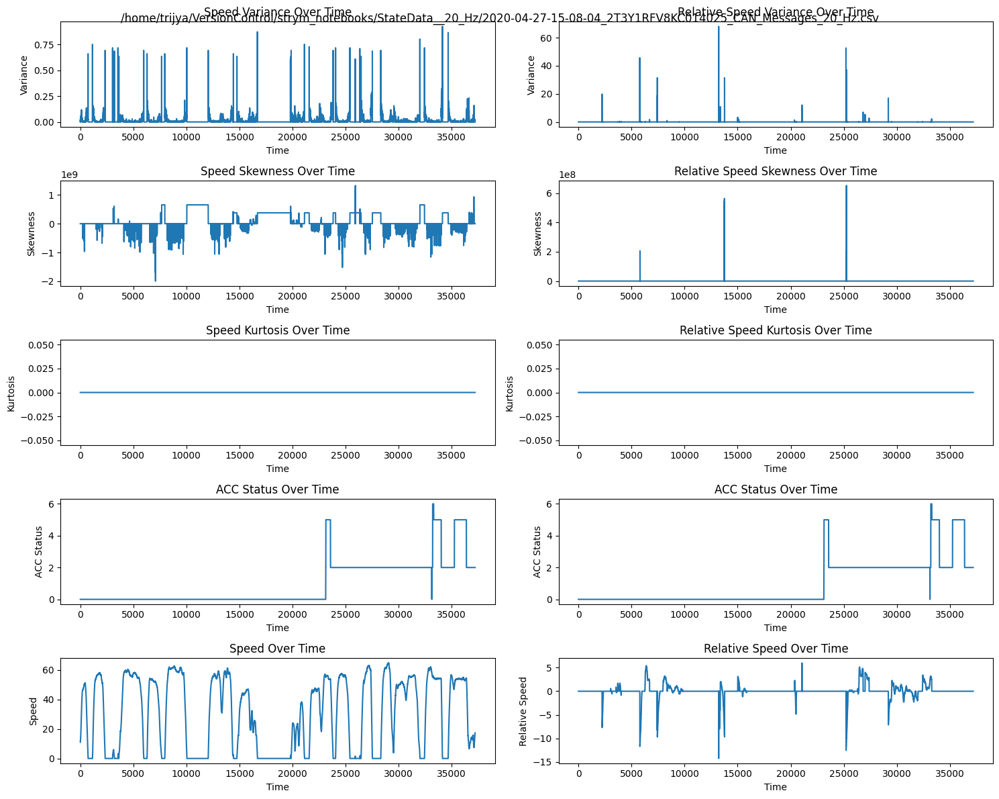

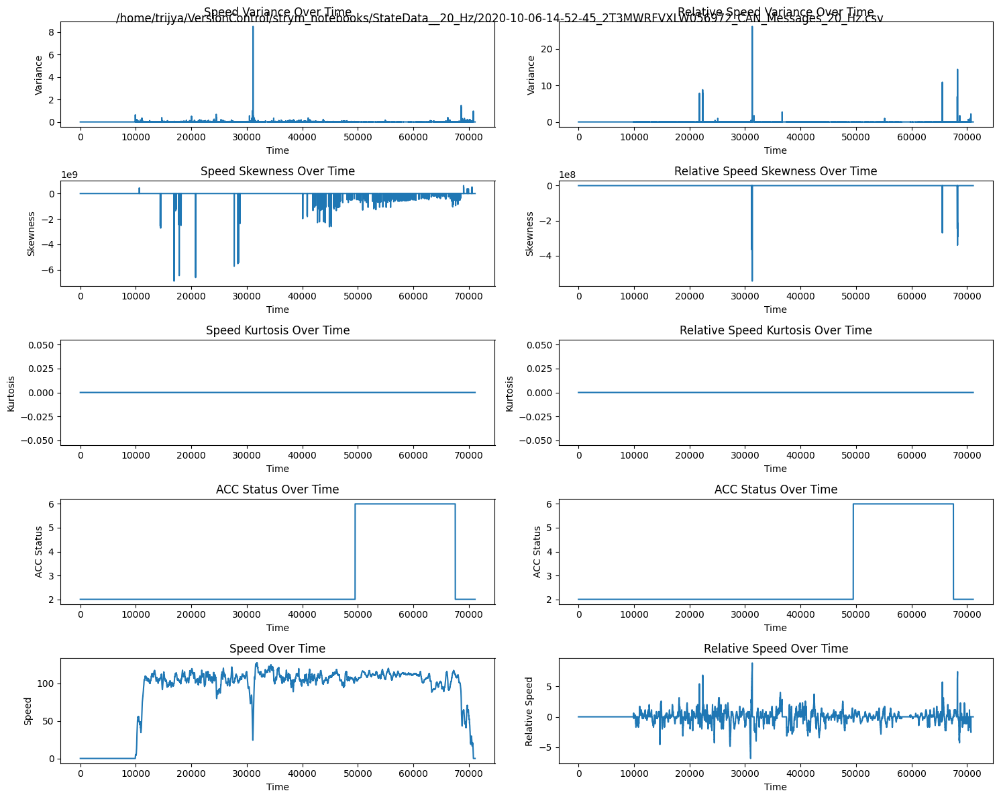

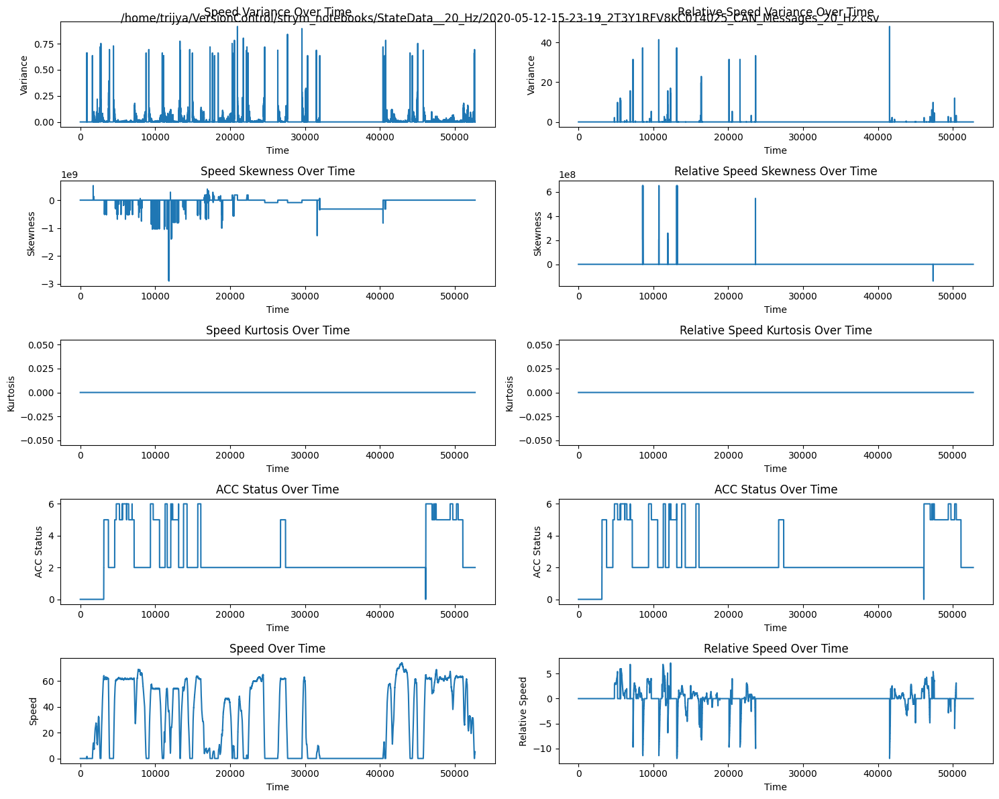

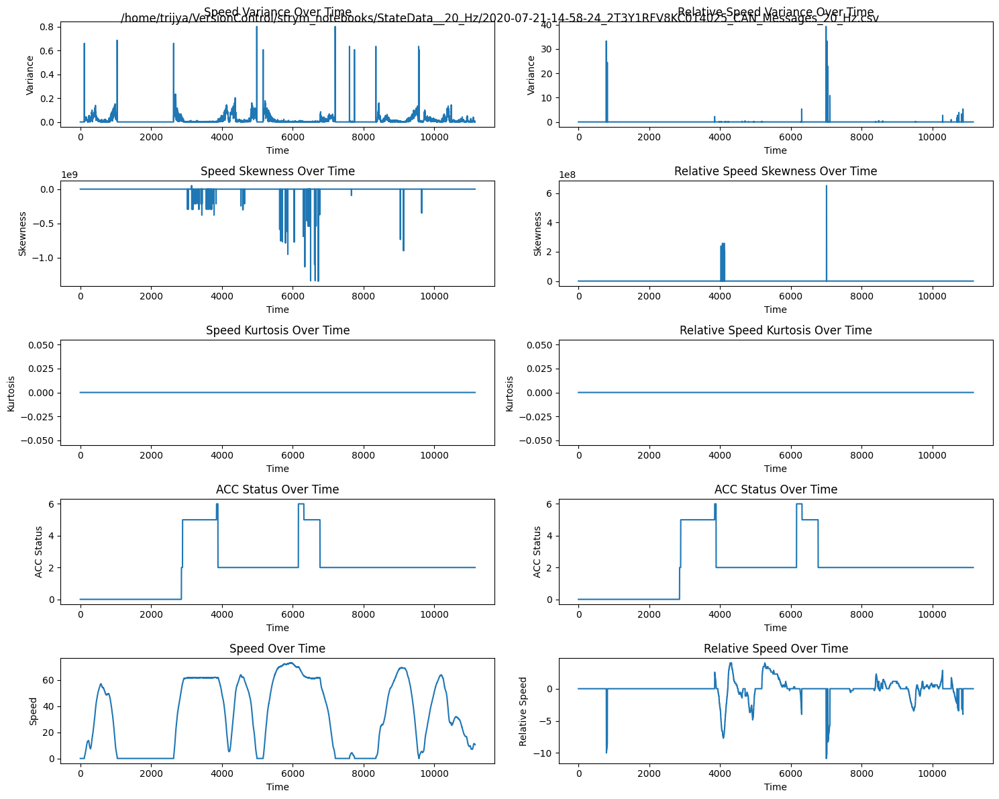

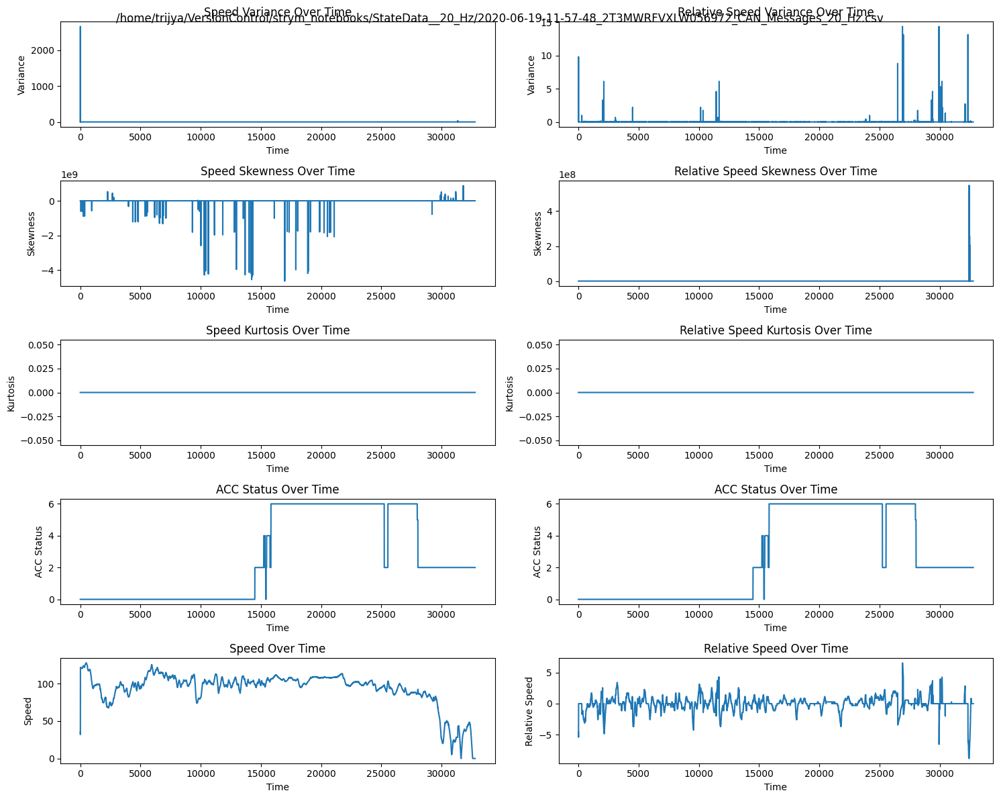

In [33]:
for csvfile in csvlisttmp:
    df = pd.read_csv(csvfile)
    df_moments = calculate_moments(df, 3, 'speed')
    df_moments = calculate_moments(df_moments, 3, 'relative_vel')
    
    import matplotlib.pyplot as plt

    # Create a figure with two rows and three columns of subplots
    fig, axs = plt.subplots(5, 2, figsize=(15, 12))

    # Speed Moments
    axs[0, 0].plot(df_moments['speed_Variance'])
    axs[0, 0].set_title('Speed Variance Over Time')
    axs[0, 0].set_xlabel('Time')
    axs[0, 0].set_ylabel('Variance')

    axs[1, 0].plot(df_moments['speed_Skewness'])
    axs[1, 0].set_title('Speed Skewness Over Time')
    axs[1, 0].set_xlabel('Time')
    axs[1, 0].set_ylabel('Skewness')

    axs[2, 0].plot(df_moments['speed_Kurtosis'])
    axs[2, 0].set_title('Speed Kurtosis Over Time')
    axs[2, 0].set_xlabel('Time')
    axs[2, 0].set_ylabel('Kurtosis')

    axs[3, 0].plot(df_moments['acc_status'])
    axs[3, 0].set_title('ACC Status Over Time')
    axs[3, 0].set_xlabel('Time')
    axs[3, 0].set_ylabel('ACC Status')

    axs[4, 0].plot(df_moments['speed'])
    axs[4, 0].set_title('Speed Over Time')
    axs[4, 0].set_xlabel('Time')
    axs[4, 0].set_ylabel('Speed')

    # Relative Speed Moments
    axs[0, 1].plot(df_moments['relative_vel_Variance'])
    axs[0, 1].set_title('Relative Speed Variance Over Time')
    axs[0, 1].set_xlabel('Time')
    axs[0, 1].set_ylabel('Variance')

    axs[1, 1].plot(df_moments['relative_vel_Skewness'])
    axs[1, 1].set_title('Relative Speed Skewness Over Time')
    axs[1, 1].set_xlabel('Time')
    axs[1, 1].set_ylabel('Skewness')

    axs[2, 1].plot(df_moments['relative_vel_Kurtosis'])
    axs[2, 1].set_title('Relative Speed Kurtosis Over Time')
    axs[2, 1].set_xlabel('Time')
    axs[2, 1].set_ylabel('Kurtosis')

    axs[3, 1].plot(df_moments['acc_status'])
    axs[3, 1].set_title('ACC Status Over Time')
    axs[3, 1].set_xlabel('Time')
    axs[3, 1].set_ylabel('ACC Status')

    axs[4, 1].plot(df_moments['relative_vel'])
    axs[4, 1].set_title('Relative Speed Over Time')
    axs[4, 1].set_xlabel('Time')
    axs[4, 1].set_ylabel('Relative Speed')


    # Layout so plots do not overlap
    fig.tight_layout()
    fig.suptitle(csvfile)
    # Display the plot
    plt.show()

In [ ]:
df_moments = calculate_moments(df, 2)
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, axs = plt.subplots(4, figsize=(10, 12))

# Plot Variance in the top subplot
axs[0].plot(df_moments['Variance'])
axs[0].set_title('Variance Over Time')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Variance')


axs[1].plot(df_moments['Skewness'])
axs[1].set_title('Skewness Over Time')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Skewnesss')

axs[2].plot(df_moments['Kurtosis'])
axs[2].set_title('Kurtosis Over Time')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Kurtosis')

# Plot acc_status in the bottom subplot
axs[3].plot(df_moments['acc_status'])
axs[3].set_title('ACC Status Over Time')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('ACC Status')


# Layout so plots do not overlap
fig.tight_layout()

# Display the plot
plt.show()

In [ ]:
df_moments = calculate_moments(df, 3)
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, axs = plt.subplots(4, figsize=(10, 12))

# Plot Variance in the top subplot
axs[0].plot(df_moments['Variance'])
axs[0].set_title('Variance Over Time')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Variance')


axs[1].plot(df_moments['Skewness'])
axs[1].set_title('Skewness Over Time')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Skewnesss')

axs[2].plot(df_moments['Kurtosis'])
axs[2].set_title('Kurtosis Over Time')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Kurtosis')

# Plot acc_status in the bottom subplot
axs[3].plot(df_moments['acc_status'])
axs[3].set_title('ACC Status Over Time')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('ACC Status')


# Layout so plots do not overlap
fig.tight_layout()

# Display the plot
plt.show()

In [ ]:
df_moments = calculate_moments(df, 4)
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, axs = plt.subplots(4, figsize=(10, 12))

# Plot Variance in the top subplot
axs[0].plot(df_moments['Variance'])
axs[0].set_title('Variance Over Time')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Variance')


axs[1].plot(df_moments['Skewness'])
axs[1].set_title('Skewness Over Time')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Skewnesss')

axs[2].plot(df_moments['Kurtosis'])
axs[2].set_title('Kurtosis Over Time')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Kurtosis')

# Plot acc_status in the bottom subplot
axs[3].plot(df_moments['acc_status'])
axs[3].set_title('ACC Status Over Time')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('ACC Status')


# Layout so plots do not overlap
fig.tight_layout()

# Display the plot
plt.show()

In [ ]:
df_moments = calculate_moments(df, 5)
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, axs = plt.subplots(4, figsize=(10, 12))

# Plot Variance in the top subplot
axs[0].plot(df_moments['Variance'])
axs[0].set_title('Variance Over Time')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Variance')


axs[1].plot(df_moments['Skewness'])
axs[1].set_title('Skewness Over Time')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Skewnesss')

axs[2].plot(df_moments['Kurtosis'])
axs[2].set_title('Kurtosis Over Time')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Kurtosis')

# Plot acc_status in the bottom subplot
axs[3].plot(df_moments['acc_status'])
axs[3].set_title('ACC Status Over Time')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('ACC Status')


# Layout so plots do not overlap
fig.tight_layout()

# Display the plot
plt.show()

In [ ]:
df_moments = calculate_moments(df, 6)
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, axs = plt.subplots(4, figsize=(10, 12))

# Plot Variance in the top subplot
axs[0].plot(df_moments['Variance'])
axs[0].set_title('Variance Over Time')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Variance')


axs[1].plot(df_moments['Skewness'])
axs[1].set_title('Skewness Over Time')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Skewnesss')

axs[2].plot(df_moments['Kurtosis'])
axs[2].set_title('Kurtosis Over Time')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Kurtosis')

# Plot acc_status in the bottom subplot
axs[3].plot(df_moments['acc_status'])
axs[3].set_title('ACC Status Over Time')
axs[3].set_xlabel('Time')
axs[3].set_ylabel('ACC Status')


# Layout so plots do not overlap
fig.tight_layout()

# Display the plot
plt.show()